<a href="https://colab.research.google.com/github/mov-z/Vision-AI-Tutorials/blob/main/examples/YOLOv5_training_custom_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **YOLOv5 Training**

**YOLOv5** 모델을 커스텀 데이터셋으로 **학습** 및 **테스트**해 보는 예제 코드입니다.
- YOLOv5 Training
- Results Viusalization
- Model save

## **1. 환경 세팅**
- 필요 패키지 설치
- 구글 드라이브 마운트 (구글 드라이브에 데이터셋을 저장한 경우)
- API Key 입력
- roboflow api key 입력
  - roboflow 로그인 후 개인별 api key 확인 필수

In [ ]:
!pip install -q roboflow
!git clone https://github.com/ultralytics/yolov5  # YOLOv5 레퍼지토리 clone
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/yolov5


In [ ]:
import os
import glob
from getpass import getpass
from roboflow import Roboflow
import torch
import yaml
from IPython.display import Image, display, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 2.4.0+cu121 (Tesla T4)


In [ ]:
# 구글 드라이브 마운트 (필요시)
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


### roboflow API Key

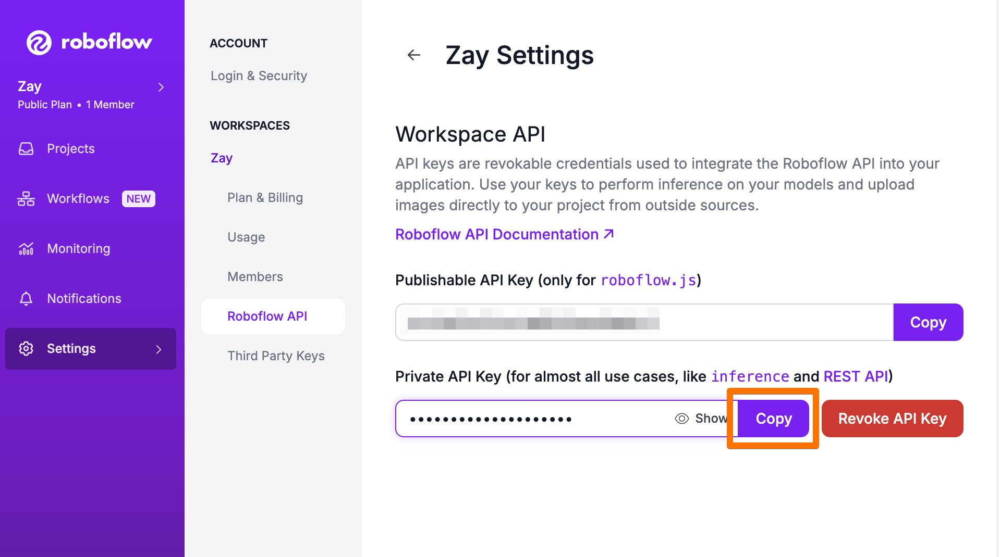

- Roboflow API Key 확인 방법

In [ ]:
# Roboflow api key 입력받기
api_key = getpass("roboflow API 키를 입력하세요: ")

roboflow API 키를 입력하세요: ··········


## **2. 데이터셋 준비**
- 예제에서는 roboflow의 퍼블릭 데이터셋을 사용
- roboflow에서 제공하는 **다운로드 코드**를 사용하여 데이터셋 및 어노테이션 파일을 다운로드 (**'TXT - YOLOv5 PyTorch' 포맷** 사용)
- [roboflow 퍼블릭 데이터셋](https://public.roboflow.com/object-detection)에서 원하는 데이터셋을 선택한 후 **Download > Show download coda > Jupyter** 에서 **다운로드 코드**를 복사
- yaml 파일 수정: train, val(또는 test) 데이터가 있는 경로 수정 (필요시)
- 다른 커스텀 데이터셋 사용하고 싶다면 데이터, 라벨, yaml 파일을 모두 퍼블릭 데이터셋의 규격에 맞게 통일 필요 (물론 코드 수정이 가능하다면 데이터셋 로딩하는 코드를 수정해도 됨)


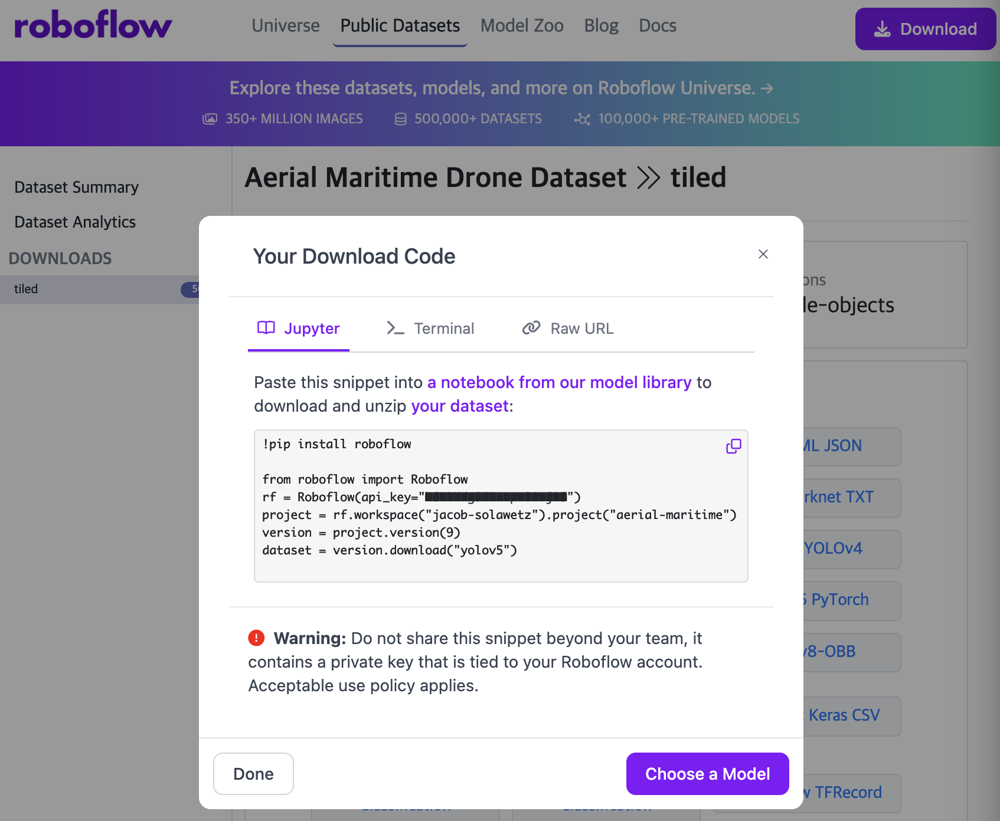

- Roboflow 데이터셋 다운로드 코드

In [ ]:
# roboflow 데이터셋 다운로드
# roboflow의 다른 데이터셋을 사용하고 싶다면 해당 블록 코드 수정 필요
rf = Roboflow(api_key=api_key)
project = rf.workspace("jacob-solawetz").project("aerial-maritime")
version = project.version(9)
dataset = version.download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Aerial-Maritime-9 in yolov5pytorch:: 100%|██████████| 1019/1019 [00:00<00:00, 5583.75it/s]


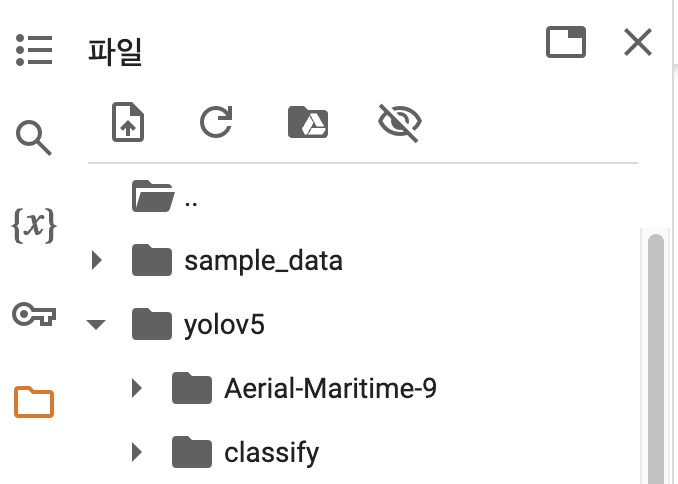

- 다운로드된 데이터셋 경로 확인

In [ ]:
# 다운받은 데이터셋 및 yaml 파일 경로 지정
data_dir = '/content/yolov5/Aerial-Maritime-9'
data_yaml = '/content/yolov5/Aerial-Maritime-9/data.yaml'

assert (os.path.exists(data_dir)) and (os.path.exists(data_yaml))

In [ ]:
# yaml 파일 확인 (데이터셋 정보)
with open(data_yaml) as f:
    film = yaml.load(f, Loader=yaml.FullLoader)
    display(film)

{'names': ['boat', 'car', 'dock', 'jetski', 'lift'],
 'nc': 5,
 'train': 'Aerial-Maritime-9/train/images',
 'val': 'Aerial-Maritime-9/valid/images'}

In [ ]:
# yaml 파일의 train, val 데이터가 있는 경로 수정 (기존 경로 -> 구글 드라이브에 저장된 경로로)
film['train'] = os.path.join(data_dir, 'train/images')
film['val'] = os.path.join(data_dir, 'test/images')

## **3. 모델 학습**
- YOLOv5 모델 학습
- 배치사이즈, 학습 에폭, 모델 사이즈 등의 하이퍼파라미터 조정 가능
- 학습 결과 중 베스트 모델이 저장됨 > 모델 저장된 경로 확인 필수!
  - img: 입력 이미지 크기
  - batch: 배치 사이즈
  - epochs: 총 학습 에폭
  - data: 데이터셋 yaml 파일 경로
  - weights: 모델 웨이트 경로(pre-train된 모델로 학습시키기 때문에)
  - cache: 캐시 이미지
  

In [ ]:
!python train.py --img 416 --batch 16 --epochs 150 --data {data_yaml} --weights yolov5s.pt --cache

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 4/4 [00:00<00:00,  5.25it/s]
                   all        105        265      0.755      0.674      0.693      0.378

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
  0% 0/24 [00:00<?, ?it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
     56/149      1.83G    0.03744    0.02946    0.01231         98        416:   4% 1/24 [00:00<00:02,  8.39it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
     56/149      1.83G    0.03865     0.0316     0.0118        120        416:   8% 2/24 [00:00<00:03,  6.21it/s]/content/yolov5/train.py:412: FutureWarn

## **4. 학습 과정 확인 - Tensorboard**
- **TensorBoard**는 TensorFlow에서 모델 학습 과정을 시각화하고 모니터링할 수 있게 해주는 도구입니다.
- 주로 Loss, Accuracy, Precision, Recall 등의 학습 지표를 실시간으로 확인하거나, 그래프와 모델 구조를 시각화할 때 사용됩니다.
- 이를 통해 모델의 성능을 추적하고, 최적화할 수 있습니다.

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

## **5. 학습한 모델 테스트**
- 학습한 모델로 테스트 데이터셋을 테스트
- 인퍼런스 결과 시각화
- 좌측 코랩 디렉토리에서 학습 및 평가 디렉토리 경로 확인 필요

In [ ]:
train_path = '/content/yolov5/runs/train'
train_folders = [folder for folder in os.listdir(train_path) if os.path.isdir(os.path.join(train_path, folder))]
print(f'Training exp 폴더: {train_folders}')

Training exp 폴더: ['exp']


In [ ]:
# 테스트 이미지 경로
test_data_dir = film['val']

# 학습 결과가 저장된 폴더 지정
# 위 코드 블럭에서 진행한 실험이 저장된 폴더 확인 후 기입 (e.g. 'exp' or 'exp1' or ...)
training_folder = 'exp'

In [ ]:
!python detect.py --weights runs/train/{training_folder}/weights/best.pt --img 416 --conf 0.1 --source {test_data_dir}

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/yolov5/Aerial-Maritime-9/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-366-gf7322921 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
image 1/32 /content/yolov5/Aerial-Maritime-9/test/images/DJI_0262_JPG.rf.3878c367b5f00b7ce0f5c9bdcb4d8486.jpg: 320x416 1 car, 29.3ms
image 2/32 /content/yolov5/Aerial-Maritime-9/test/images/DJI_0262_JPG.rf.47ce7cf6d8e3e310ab9b2b5c15ebba72.jpg: 320x416 (no detections), 8.5ms
image 3/32 /co

In [ ]:
test_path = '/content/yolov5/runs/detect'
test_folders = [folder for folder in os.listdir(test_path) if os.path.isdir(os.path.join(test_path, folder))]
print(f'테스트 결과 폴더: {test_folders}')

테스트 결과 폴더: ['exp']


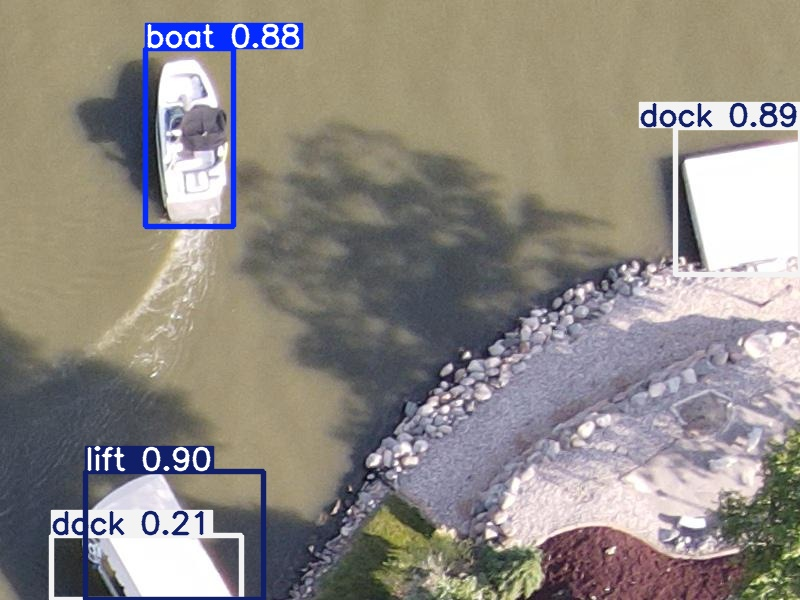

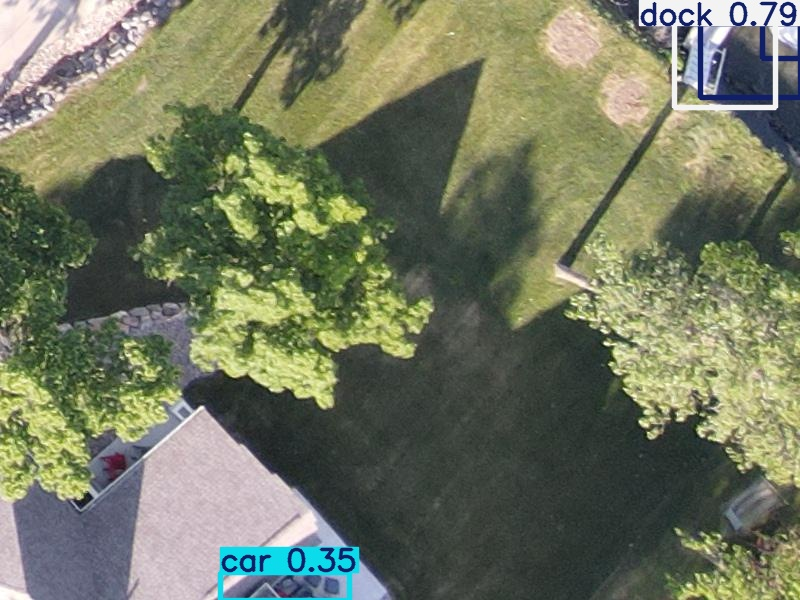

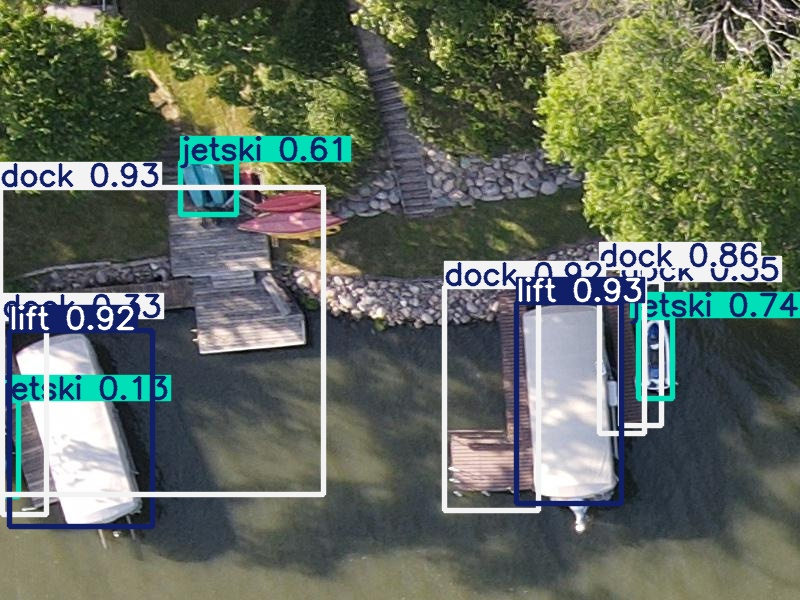

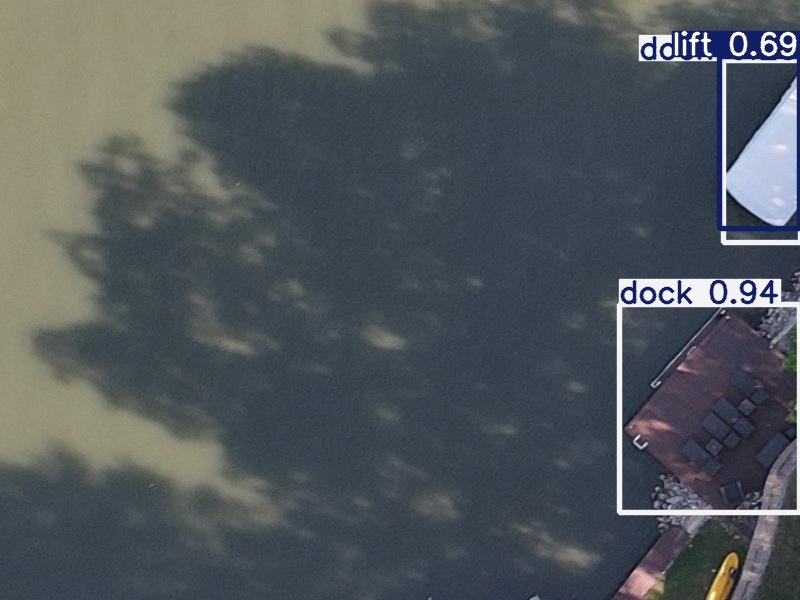

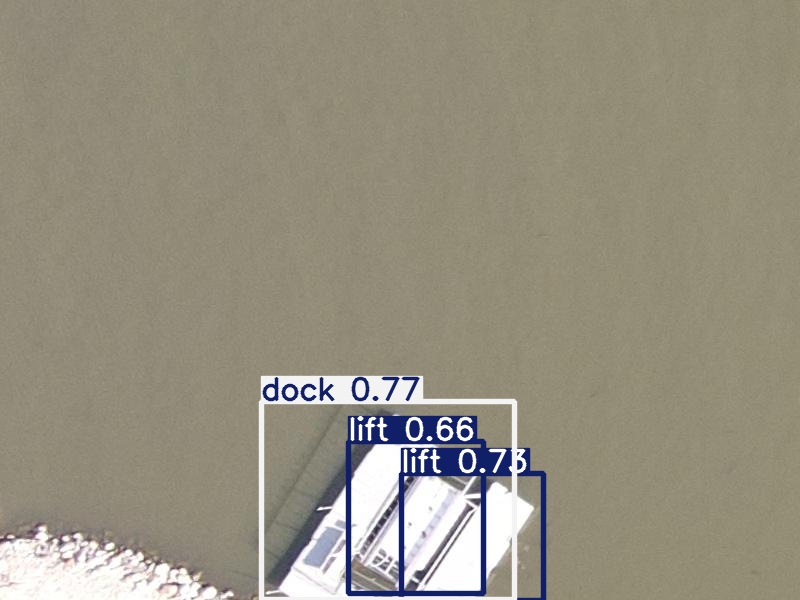

...

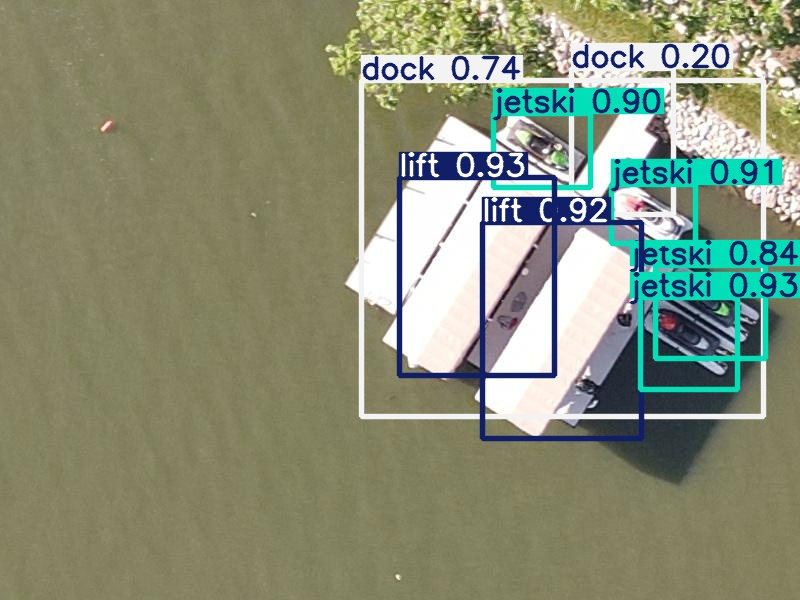

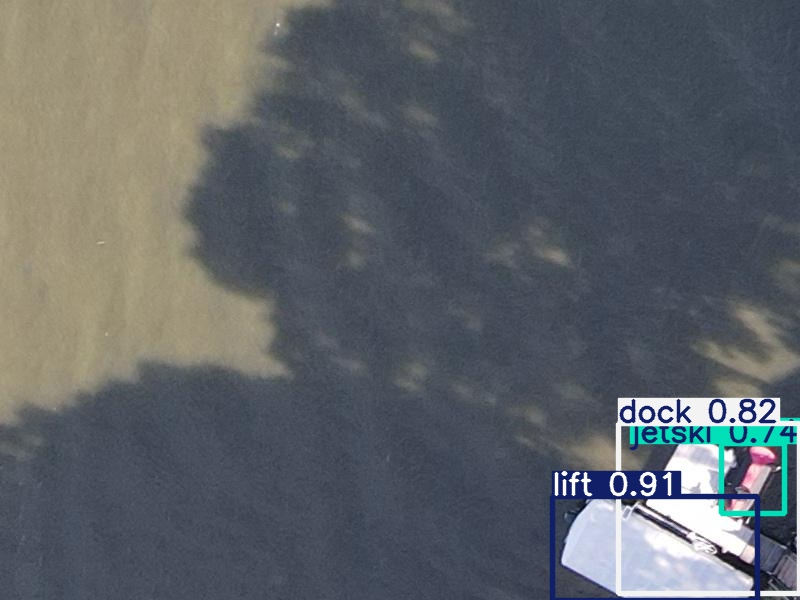

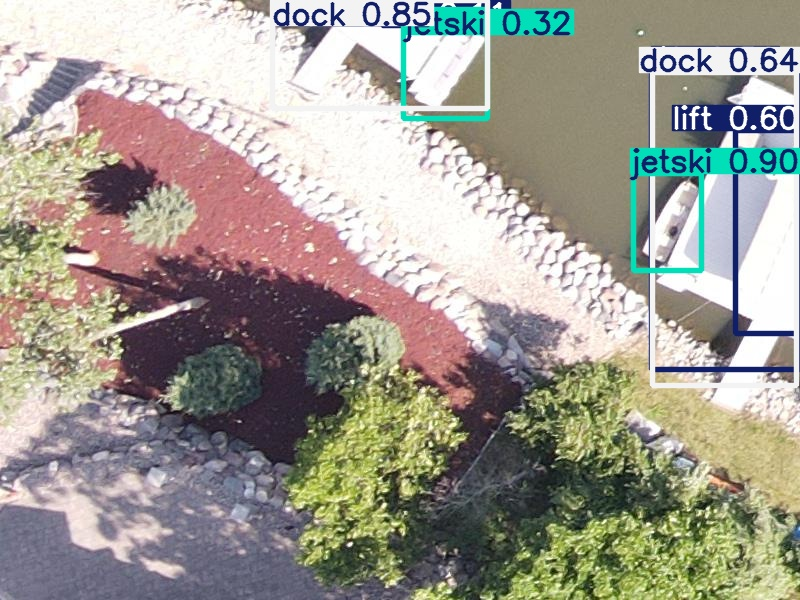

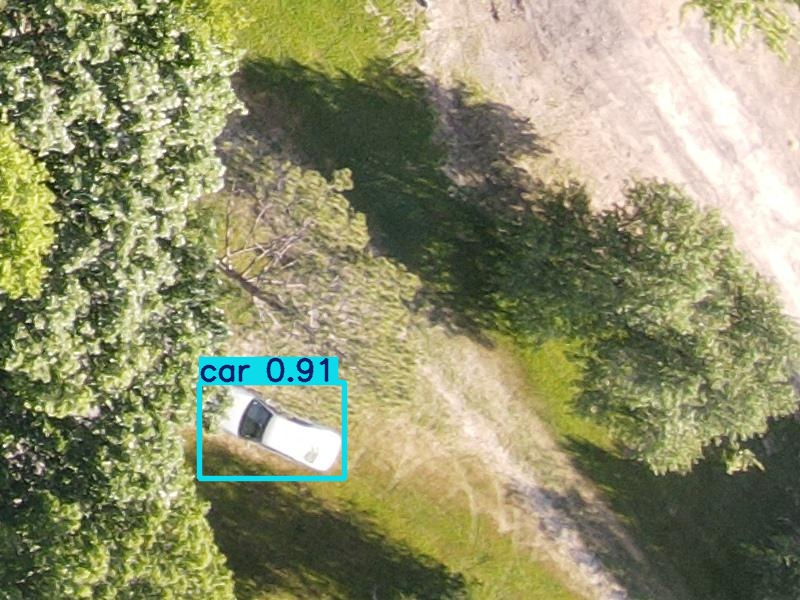

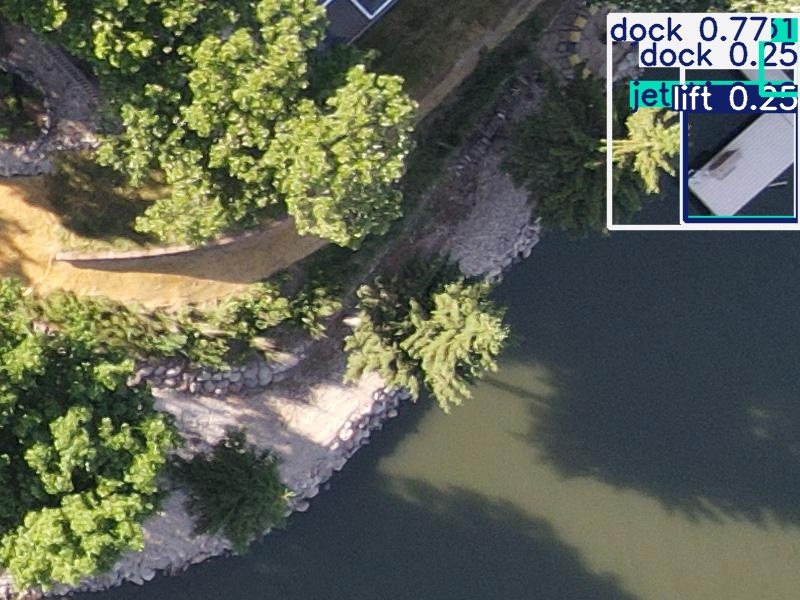

In [ ]:
# 테스트 결과 확인해보기
test_exp_folder = 'exp'

assert (os.path.join(test_path, test_exp_folder))

for imageName in glob.glob(os.path.join(test_path, test_exp_folder + '/*.jpg')): #assuming JPG
    display(Image(filename=imageName))
    print("\n")